# Signal processing

## Assignment 2

### Dimitrije Zdrale and Marija brkic

### TO DO: FIR DELAY EFFECT

In [164]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile

fs=44100 Hz | D=1000 samples | alpha=0.5


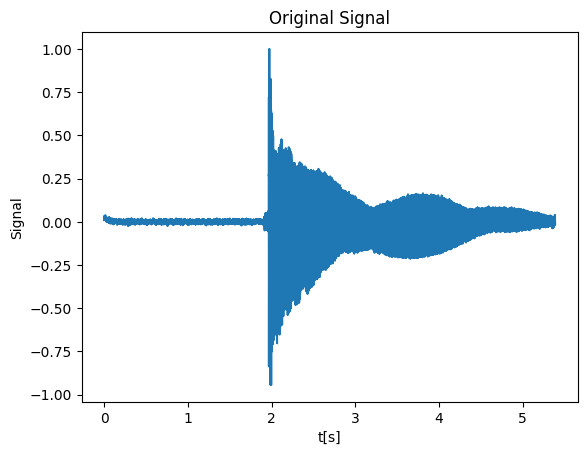

In [165]:
fs, x = wavfile.read("data/string_1.wav")   
x = x.astype(np.float32)
x /= np.max(np.abs(x)) + 1e-12               # normalize to [-1,1]

t = np.arange(len(x))/fs

plt.figure()
plt.plot(t, x)
plt.title("Original Signal")
plt.xlabel("t[s]")
plt.ylabel("Signal")
# params    
alpha = 0.5           
D = 1000        # delay in samples       
print(f"fs={fs} Hz | D={D} samples | alpha={alpha}")

Text(0, 0.5, 'Signal')

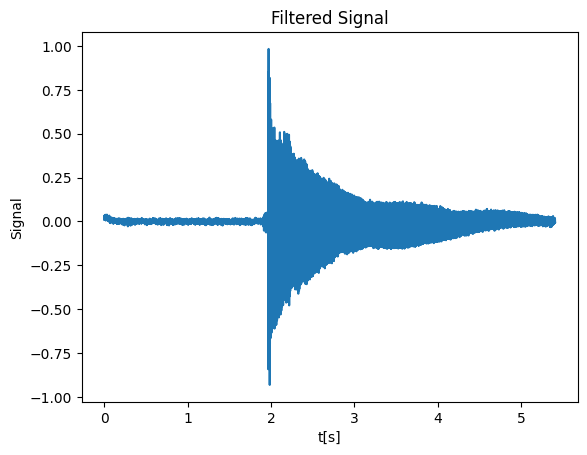

In [166]:
y = np.zeros(len(x) + D, dtype=np.float32)
y[:len(x)] += x
y[D:D+len(x)] += alpha * x

t_y = np.arange(len(y))/fs

plt.figure()
plt.plot(t_y, y)
plt.title("Filtered Signal")
plt.xlabel("t[s]")
plt.ylabel("Signal")

Since we chose D to be 1000 samples, which is a small number compared to the length of the signal so it can just slightly be seen on the graph.

Impulse response


The impulse response of a system (in this case, a filter) is the output of the system when the input signal is an **impulse**, represented by the Dirac delta function:

$$
\delta[t] =
\begin{cases}
1, & t = 0 \\
0, & t \neq 0
\end{cases}
\quad \text{with} \quad \sum_{t=-\infty}^{\infty} \delta[t] = 1
$$

In this specific case it would be:

$$ s[t] = \delta[t] + \alpha \delta[t-D]$$

which exactly what is shown in next figures.

In [167]:
h = np.zeros(D+1, dtype=np.float32)
h[0] = 1.0
h[D] = alpha

# Check: y_conv = x * h (linear convolution)
y_conv = np.convolve(x, h, mode="full")
np.allclose(y, y_conv)

True

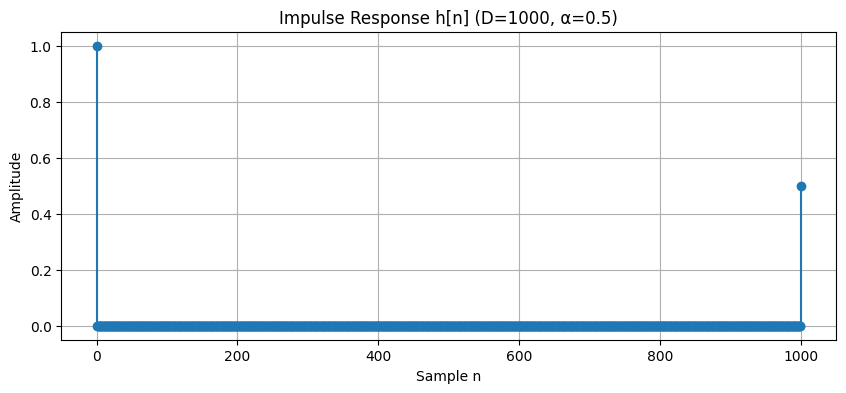

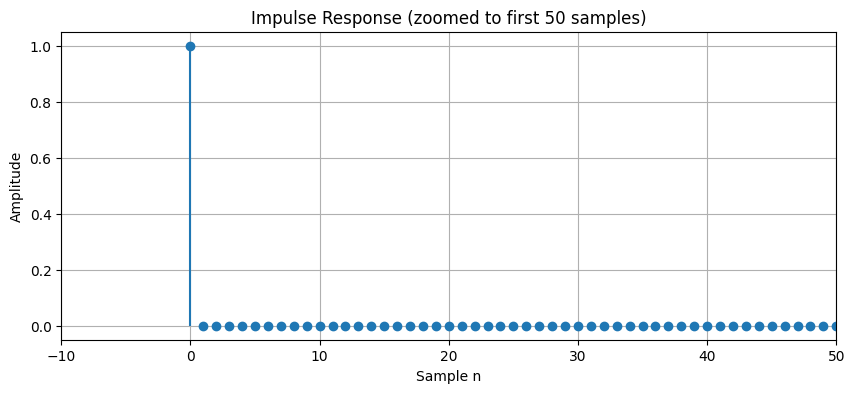

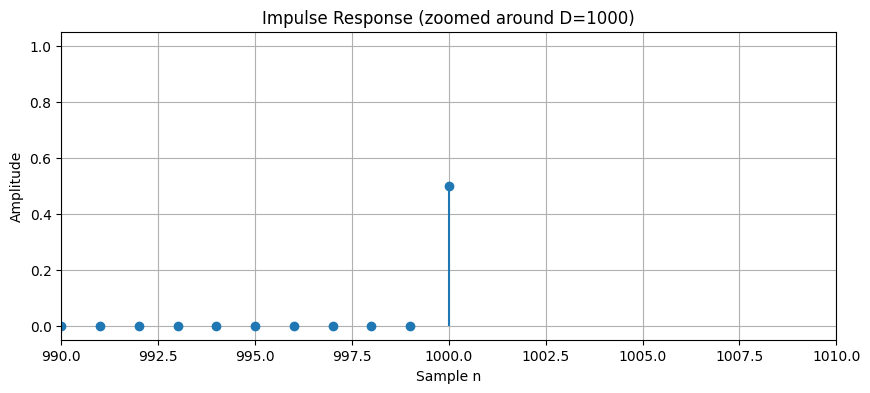

In [168]:
# plot of the Impulse Response around different zoom levels
plt.figure(figsize=(10,4))
plt.stem(h, basefmt=' ')
plt.xlabel("Sample n")
plt.ylabel("Amplitude")
plt.title(f"Impulse Response h[n] (D={D}, α={alpha})")
plt.grid(True)
plt.show()

plt.figure(figsize=(10,4))
plt.stem(h, basefmt=' ')
plt.xlim(-10, 50)
plt.xlabel("Sample n")
plt.ylabel("Amplitude")
plt.title("Impulse Response (zoomed to first 50 samples)")
plt.grid(True)
plt.show()

plt.figure(figsize=(10,4))
plt.stem(h, basefmt=' ')
plt.xlim(D-10, D+10)
plt.xlabel("Sample n")
plt.ylabel("Amplitude")
plt.title(f"Impulse Response (zoomed around D={D})")
plt.grid(True)
plt.show()

Frequency response


Frequency response of a system is a spectrum (FFT) of its impulse response. In this case, it is:

$$
H(f) = \mathcal{F}\{h[n]\} = 1 + \alpha \cdot e^{-j 2\pi f D / f_s}
$$

where $h[n] = \delta[n] + \alpha \delta[n-D]$ is the impulse response, $D$ is the delay in samples, $\alpha$ is the gain, $f$ is frequency in Hz, and $f_s$ is the sampling rate.

[ 0.0000000e+00 -1.9174759e-01 -3.8349521e-01 ... -3.1412161e+03
 -3.1414080e+03 -3.1415996e+03]
[-0.00000000e+00 -1.91747598e-01 -3.83495197e-01 ... -3.14120916e+03
 -3.14140091e+03 -3.14159265e+03]


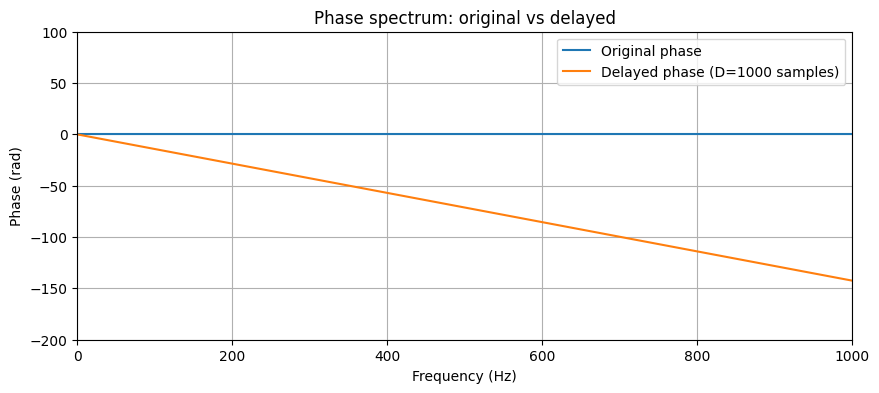

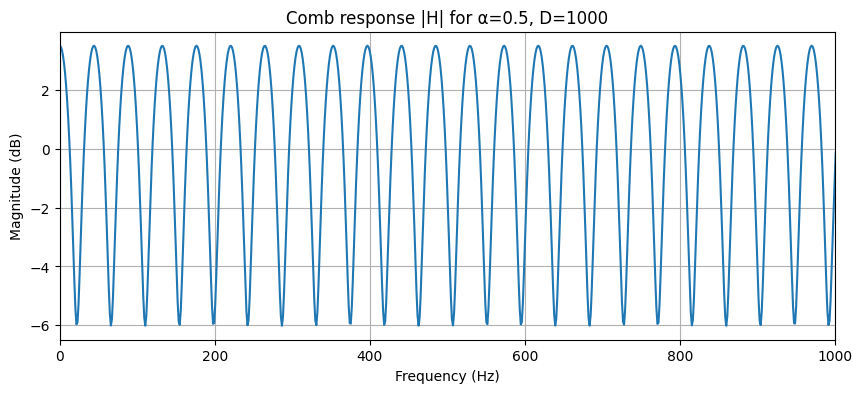

In [174]:
h1 = np.zeros(D+1, dtype=np.float32)
h1[0] = 1.0
h2 = np.zeros(D+1, dtype=np.float32)
h2[D] = 1.0

Nfft = 32768
H     = np.fft.rfft(h1, n=Nfft)
H_del = np.fft.rfft(h2, n=Nfft)
f = np.fft.rfftfreq(Nfft, 1/fs)
omega = 2*np.pi*f

# Unwrap individual phases, then subtract
phase_orig = np.unwrap(np.angle(H))
phase_del  = np.unwrap(np.angle(H_del))
phase_diff_measured = phase_del - phase_orig
phase_shift_theory  = -omega * D / fs
print(phase_diff_measured)
print(phase_shift_theory)

plt.figure(figsize=(10,4))
plt.xlim(0, 1000)
plt.ylim(-200, 100)
plt.plot(f, phase_orig, label="Original phase")
plt.plot(f, phase_del,  label=f"Delayed phase (D={D} samples)")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Phase (rad)")
plt.title("Phase spectrum: original vs delayed")
plt.legend()
plt.grid(True)
plt.show()

# frequency response plot
H = 1 + alpha * np.exp(-1j * 2 * np.pi * f * D / fs)
mag_db = 20*np.log10(np.abs(H) + 1e-12)

plt.figure(figsize=(10,4))
plt.plot(f, mag_db)
plt.xlim(0, 1000)
plt.xlabel("Frequency (Hz)"); plt.ylabel("Magnitude (dB)")
plt.title(f"Comb response |H| for α={alpha}, D={D}")
plt.grid(True)
plt.show()

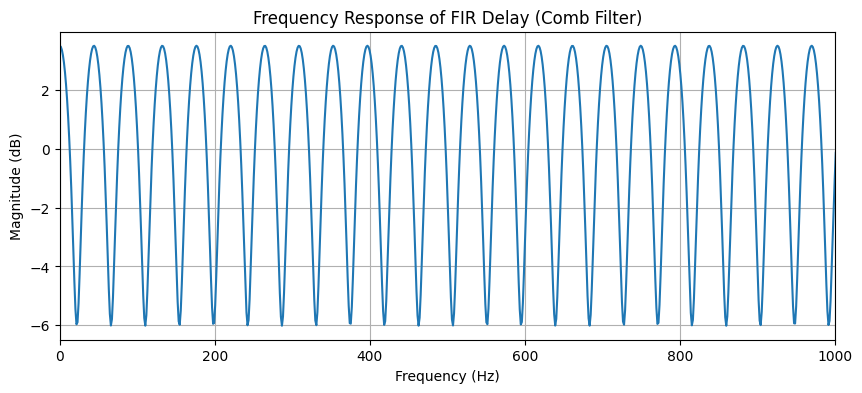

In [182]:
# Zero-pad h for a smooth spectrum plot
# Frequency response using FFT
Nfft = 32768
H = np.fft.rfft(h, n=Nfft)
f = np.fft.rfftfreq(Nfft, 1/fs)


plt.figure(figsize=(10,4))
plt.plot(f, 20*np.log10(np.abs(H)+1e-12))
plt.xlim(0, 1000)
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude (dB)")
plt.title("Frequency Response of FIR Delay (Comb Filter)")
plt.grid(True)
plt.show()

### Frequency Response Analysis

The magnitude of frequency response of the FIR filter is:

$$
|H(f)| = \left| 1 + \alpha \cdot e^{-j 2\pi f D / f_s} \right|
$$

which is:

$$
|H(f)| = \sqrt{1 + \alpha^2 + 2\alpha \cos\left(2\pi f D / f_s\right)}
$$

This formula shows that the magnitude response oscillates between peaks and notches as frequency $f$ increases. The hight of these oscillations is determined by $\alpha$ and its frequency depends on $D$.

The analytical and FFT-based magnitude of frequency response plots match closely, confirming the theoretical behavior of the filter.

Furthermore, a delay in the time domain corresponds to a linear phase shift in the frequency domain.

- The phase shift for each frequency $f$ is given by $-\omega D / f_s = -2\pi f D / f_s$, where $D$ is the delay in samples.
- As frequency increases, the phase shift becomes more negative, resulting in a downward-sloping line in the phase plot.
- The original signal has no delay, so its phase is flat, while the delayed signal shows this linear phase shift.

We used a Dirac impulse and delayed it by D, then plotted the phases of both. The behavior matches the theoretical description: the numerical phase shift and the theoretical phase shift align closely.

In [175]:
y_out = y / (np.max(np.abs(y)) + 1e-12)

wavfile.write("out_fir_delay.wav", fs, (y_out * 32767).astype(np.int16))

### TO DO: IIR DELAY EFFECT

In [176]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile

fs=44100 Hz | D=1000 samples | alpha=0.5


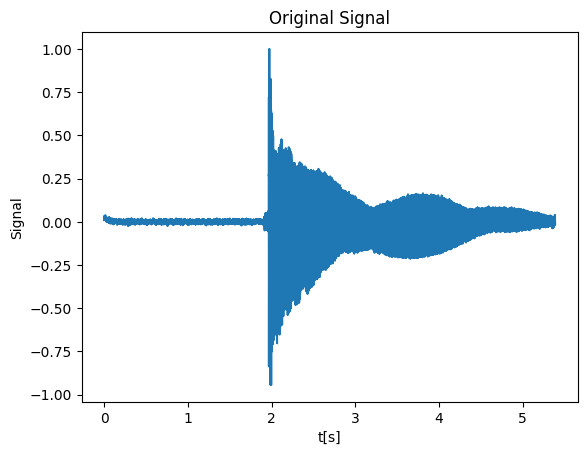

In [ ]:
fs, x = wavfile.read("data/string_1.wav")   
x = x.astype(np.float32)
x /= np.max(np.abs(x)) + 1e-12               # normalize to [-1,1]

t = np.arange(len(x))/fs
plt.figure()
plt.plot(t, x)
plt.title("Original Signal")
plt.xlabel("t[s]")
plt.ylabel("Signal")

# params   
alpha = 0.5     
beta = 0.5         
D = 1000
print(f"fs={fs} Hz | D={D} samples | alpha={alpha}")

Text(0, 0.5, 'Signal')

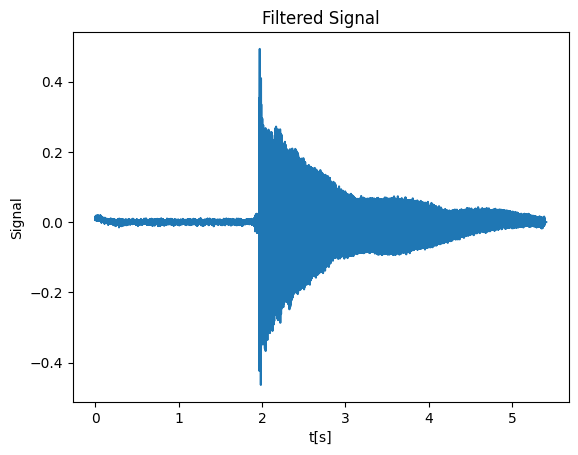

In [178]:
y = np.zeros(len(x) + D, dtype=np.float32)
for n in range(len(x)):
    y[n] = alpha * x[n]
    if n >= D:
        y[n] += beta * y[n-D]

t_y = np.arange(len(y))/fs
plt.figure()
plt.plot(t_y, y)
plt.title("Filtered Signal")
plt.xlabel("t[s]")
plt.ylabel("Signal")

In this case the change in the signal could also be slightly seen.

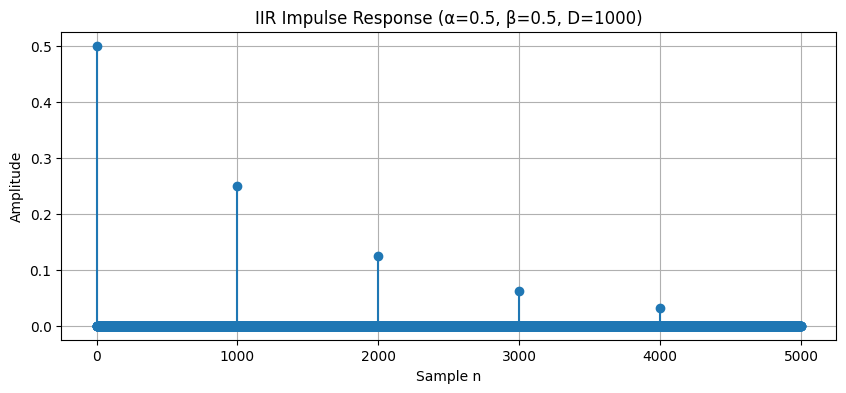

In [ ]:
N = 10000 # Length of impulse response to compute since its infinite
impulse = np.zeros(N, dtype=np.float32)
impulse[0] = 1.0

h_iir = np.zeros(N, dtype=np.float32)
for n in range(N):
    h_iir[n] = alpha * impulse[n]
    if n >= D:
        h_iir[n] += beta * h_iir[n-D]

# Plot impulse response
plt.figure(figsize=(10,4))
plt.stem(h_iir[:5*D], basefmt=' ')
plt.xlabel("Sample n")
plt.ylabel("Amplitude")
plt.title(f"IIR Impulse Response (α={alpha}, β={beta}, D={D})")
plt.grid(True)
plt.show()

Frequency response


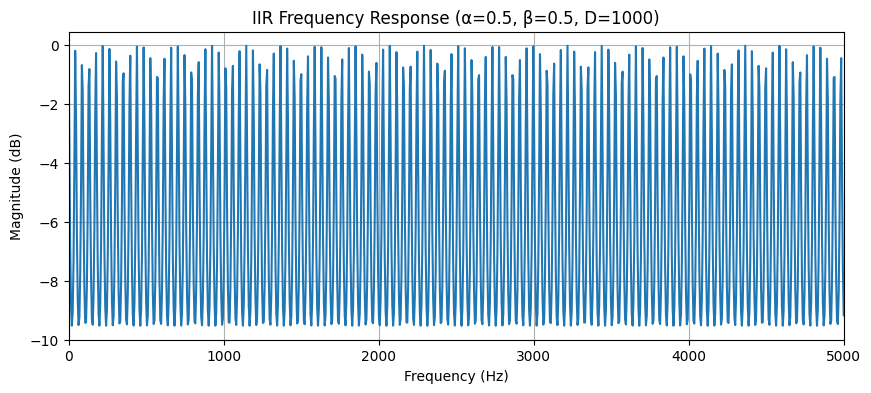

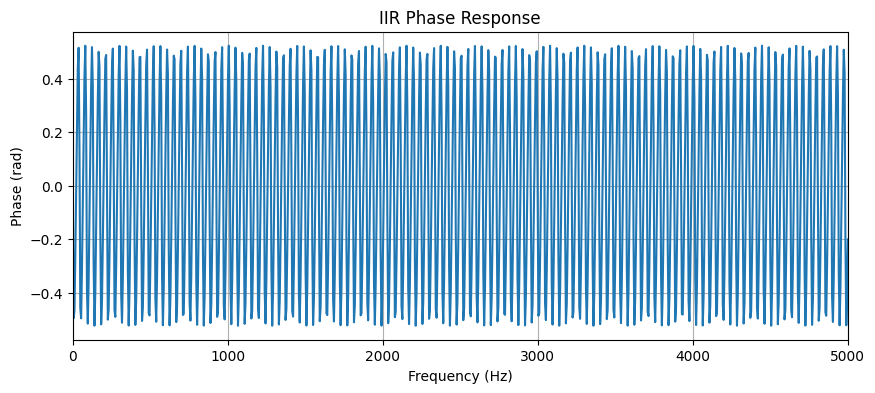

In [ ]:
Nfft = 8192
H_iir = np.fft.rfft(h_iir, n=Nfft)
f = np.fft.rfftfreq(Nfft, 1/fs)

# Magnitude response
plt.figure(figsize=(10,4))
plt.plot(f, 20*np.log10(np.abs(H_iir)+1e-12))
plt.xlim(0, 5000)
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude (dB)")
plt.title(f"IIR Frequency Response (α={alpha}, β={beta}, D={D})")
plt.grid(True)
plt.show()

# Phase response
plt.figure(figsize=(10,4))
plt.plot(f, np.unwrap(np.angle(H_iir)))
plt.xlim(0, 5000)
plt.xlabel("Frequency (Hz)")
plt.ylabel("Phase (rad)")
plt.title("IIR Phase Response")
plt.grid(True)
plt.show()

Both magnitude and phase of the impuls response of the IIR filter seem to be periodical.

### Is this implementation always stable?

No, not always, it is only stable if | $\beta$ | < 1.

Theorem: A system is BIBO (bounded-input bounded-output) stable if every bounded input produces a bounded output.

## BIBO Stability Proof for IIR Comb Filter

  ### BIBO Stability Definition:
  A system is BIBO stable if and only if every bounded input produces a bounded output.

  **Equivalently:** A system is BIBO stable iff its impulse response is absolutely summable:

  $$\sum_{n=-\infty}^{\infty} |h[n]| < \infty$$

  **Given system:** $y[n] = \alpha \cdot x[n] + \beta \cdot y[n-D]$

  ---

  ### Step 1: Find impulse response

  For input $x[n] = \delta[n]$:

  $$h[0] = \alpha$$

  $$h[D] = \beta \cdot h[0] = \alpha \beta$$

  $$h[2D] = \beta \cdot h[D] = \alpha \beta^2$$

  $$h[kD] = \alpha \beta^k \quad \text{for } k = 0, 1, 2, \ldots$$

  $$h[n] = 0 \quad \text{for } n \neq kD$$

  ---

  ### Step 2: Check absolute summability

  $$\sum_{n=0}^{\infty} |h[n]| = \sum_{k=0}^{\infty} |\alpha \beta^k| = |\alpha| \sum_{k=0}^{\infty} |\beta|^k$$

  ---

  ### Step 3: Apply geometric series test

  The geometric series $\sum_{k=0}^{\infty} |\beta|^k$ converges if and only if $|\beta| < 1$:

  - If $|\beta| < 1$: 
    $$\sum_{k=0}^{\infty} |\beta|^k = \frac{1}{1-|\beta|} < \infty \quad \Rightarrow \textbf{ stable}$$

  - If $|\beta| \geq 1$:
    $$\sum_{k=0}^{\infty} |\beta|^k = \infty \quad \Rightarrow \textbf{ unstable}$$

  ---

  ### Conclusion:

  The IIR comb filter is BIBO stable **if and only if** $|\beta| < 1$.


### Parameter discussion

$ \alpha $ - Input gain, controls direct signal level, how much of the original signal is heard

$ \beta $ - Feedback coefficient, controls the echo/reverb intensity, very important for stability as seen above. This parameter determines the deacy rate, impulse decays exponentially.

D - controls delay time.


### Comparison to FIR implementation

FIR is a more simpe and computationally easy, and it is faster. It is also always stable.

IIR is more complex in this sense, especially since it requires sequential processing.

### TO DO: IMAGE FILTERING

In [13]:
import skimage
from skimage import io
import numpy as np  
import matplotlib.pyplot as plt
import scipy.ndimage


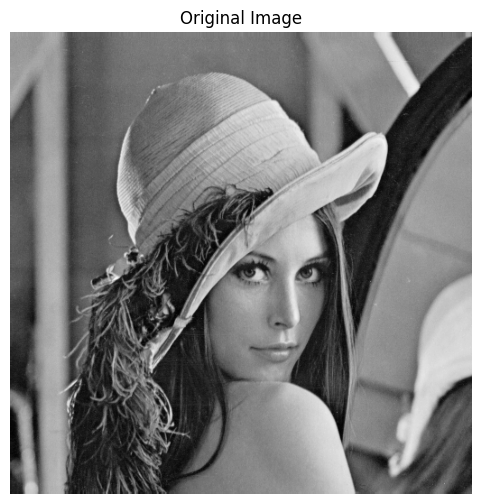

In [2]:
image = io.imread('data/lena.tif')
image = skimage.img_as_float(image)
plt.figure(figsize=(6,6))
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.show()

Gradient filter:

In [183]:
def gradient(image):
    Gx_kernel = np.array([[-1, 0, 1]]) # x direction
    Gy_kernel = np.array([[-1], [0], [1]]) # y direction
    

    Gx = scipy.ndimage.convolve(image, Gx_kernel, mode='nearest')
    Gy = scipy.ndimage.convolve(image, Gy_kernel, mode='nearest')
    
    # gradient magnitude
    mag = np.sqrt(Gx**2 + Gy**2)
    
    # gradient angle
    Gx_fix = np.copy(Gx)
    Gx_fix[Gx_fix == 0] = 1 # to avoid division by zero
    angle = np.arctan(np.divide(Gy, Gx_fix))
    angle[(Gx==0)&(Gy>0)] = np.pi/2 
    angle[(Gx==0)&(Gy<0)] = -np.pi/2
    angle[(Gx==0)&(Gy==0)] = 0
    
    return Gx, Gy, mag, angle


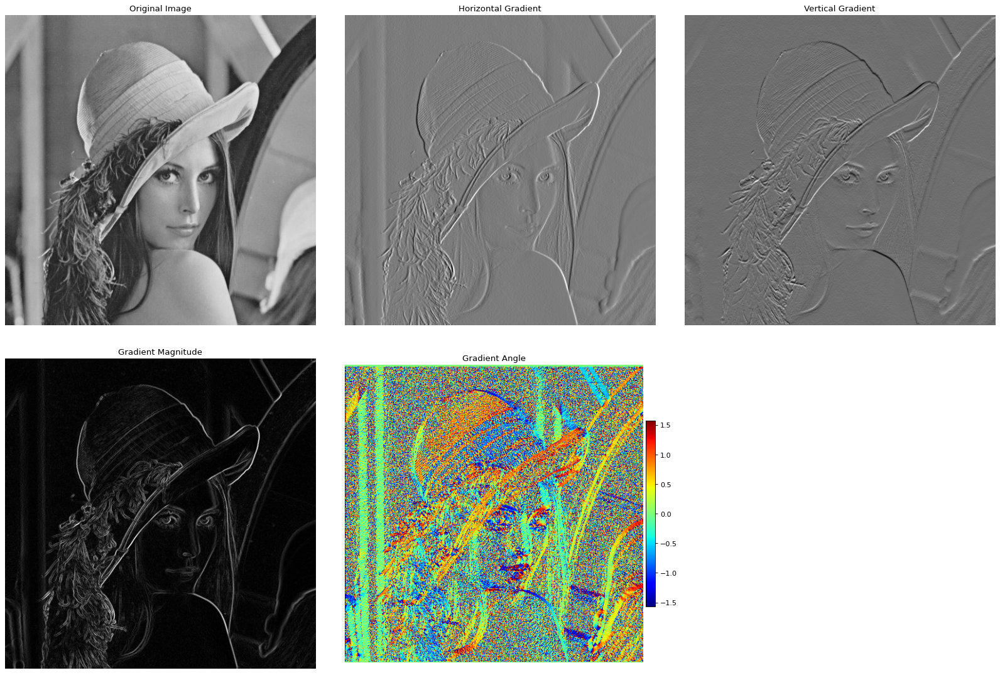

In [4]:
(Gx, Gy, mag, angle) = gradient(image)


figure, ax = plt.subplots(nrows=2, ncols=3, figsize=(20,14), dpi=80)
for plot in ax.flatten():
    plot.axis('off')

ax[0,0].imshow(image,     cmap='gray', vmin=0, vmax=1), ax[0,0].set_title('Original Image')
ax[0,1].imshow(Gx,  cmap='gray'), ax[0,1].set_title('Horizontal Gradient'), ax[0,1].axis('off')
ax[0,2].imshow(Gy,  cmap='gray'), ax[0,2].set_title('Vertical Gradient'), ax[0,2].axis('off')
ax[1,0].imshow(mag,  cmap='gray'), ax[1,0].set_title('Gradient Magnitude'), ax[1,0].axis('off')
im1 = ax[1,1].imshow(angle, cmap='jet')
ax[1,1].set_title('Gradient Angle')
figure.colorbar(im1, ax=ax[1,1], fraction=0.03, pad=0.01)
plt.tight_layout()
plt.show()

On the previous images we can see the horizontal and vertical gradients, denoted as $G_x$ and $G_y$. The magnitude of the gradient is calculated as:
$$
\text{magnitude} = \sqrt{G_x^2 + G_y^2}
$$
and the angle is:
$$
\text{angle} = \arctan\left(\frac{G_y}{G_x}\right)
$$
The magnitude effectively shows the strength of edges, while the angle indicates the orientation of the edge **relative to the horizontal ($x$) axis**. For example, an angle of $0$ means the edge is horizontal, and $\pm \frac{\pi}{2}$ means the edge is vertical.

The gradient is very sensitive to any changes, so it will detect fine details as well as noise.

Sobel Filter

In [5]:
def sobel(image):
    Gy_kernel = np.array([[-1, -2, -1],[0, 0, 0],[1, 2, 1]]) # y direction
    Gx_kernel = np.transpose(Gy_kernel) # x direction
    

    Gx = scipy.ndimage.convolve(image, Gx_kernel, mode='nearest')
    Gy = scipy.ndimage.convolve(image, Gy_kernel, mode='nearest')
    
    # sobel gradient magnitude
    mag = np.sqrt(Gx**2 + Gy**2)
    
    # sobel gradient angle
    Gx_fix = np.copy(Gx)
    Gx_fix[Gx_fix == 0] = 1
    angle = np.arctan(np.divide(Gy, Gx_fix))
    angle[(Gx==0)&(Gy>0)] = np.pi/2
    angle[(Gx==0)&(Gy<0)] = -np.pi/2
    angle[(Gx==0)&(Gy==0)] = 0
    
    return Gx, Gy, mag, angle


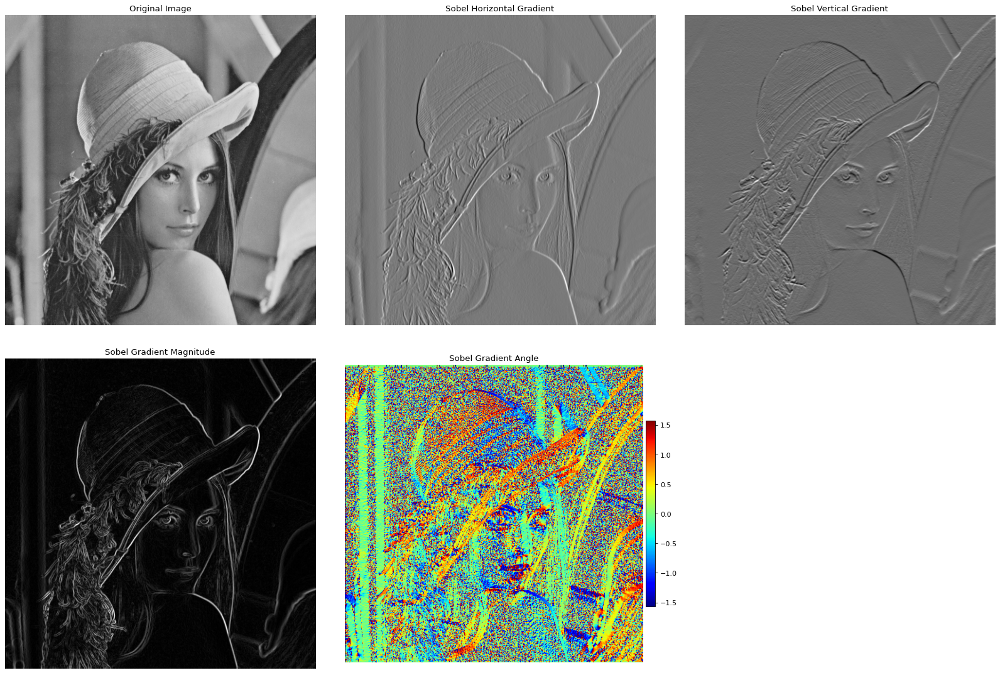

In [6]:
(Gx, Gy, mag, angle) = sobel(image)


figure, ax = plt.subplots(nrows=2, ncols=3, figsize=(20,14), dpi=80)
for plot in ax.flatten():
    plot.axis('off')

ax[0,0].imshow(image,     cmap='gray', vmin=0, vmax=1), ax[0,0].set_title('Original Image')
ax[0,1].imshow(Gx,  cmap='gray'), ax[0,1].set_title('Sobel Horizontal Gradient'), ax[0,1].axis('off')
ax[0,2].imshow(Gy,  cmap='gray'), ax[0,2].set_title('Sobel Vertical Gradient'), ax[0,2].axis('off')
ax[1,0].imshow(mag,  cmap='gray'), ax[1,0].set_title('Sobel Gradient Magnitude'), ax[1,0].axis('off')
im1 = ax[1,1].imshow(angle, cmap='jet')
ax[1,1].set_title('Sobel Gradient Angle')
figure.colorbar(im1, ax=ax[1,1], fraction=0.03, pad=0.01)
plt.tight_layout()
plt.show()

Sobel filter basically detects horisontal and vertical changes in the very s

Averaging Filter

In [7]:
def averaging_filter(image, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size), dtype=np.float64) / (kernel_size**2)
    smoothed = scipy.ndimage.convolve(image, kernel, mode='nearest')
    
    return smoothed

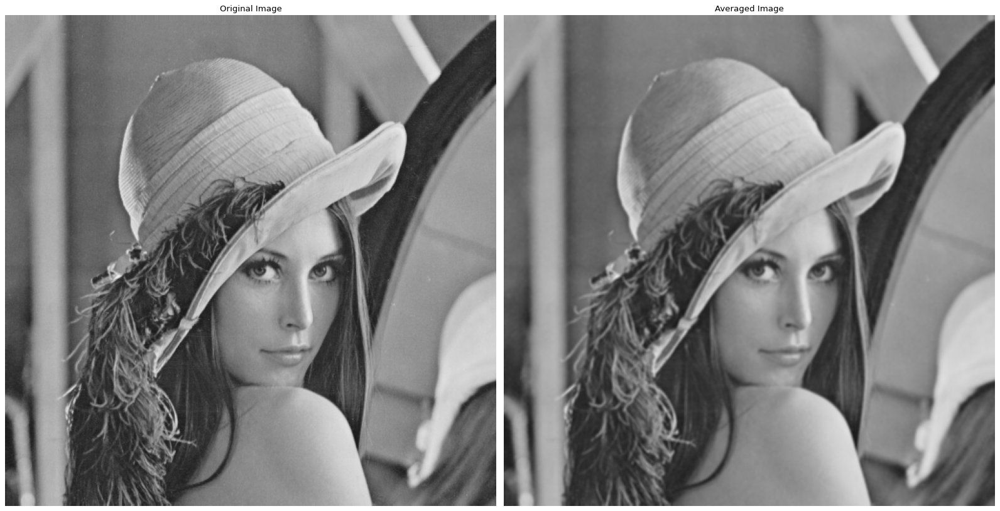

In [8]:
blurred = averaging_filter(image)


figure, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,14), dpi=80)
for plot in ax.flatten():
    plot.axis('off')

ax[0].imshow(image,     cmap='gray', vmin=0, vmax=1), ax[0].set_title('Original Image')
ax[1].imshow(blurred,     cmap='gray', vmin=0, vmax=1), ax[1].set_title('Averaged Image'), ax[1].axis('off')
plt.tight_layout()
plt.show()

Gaussian Filter

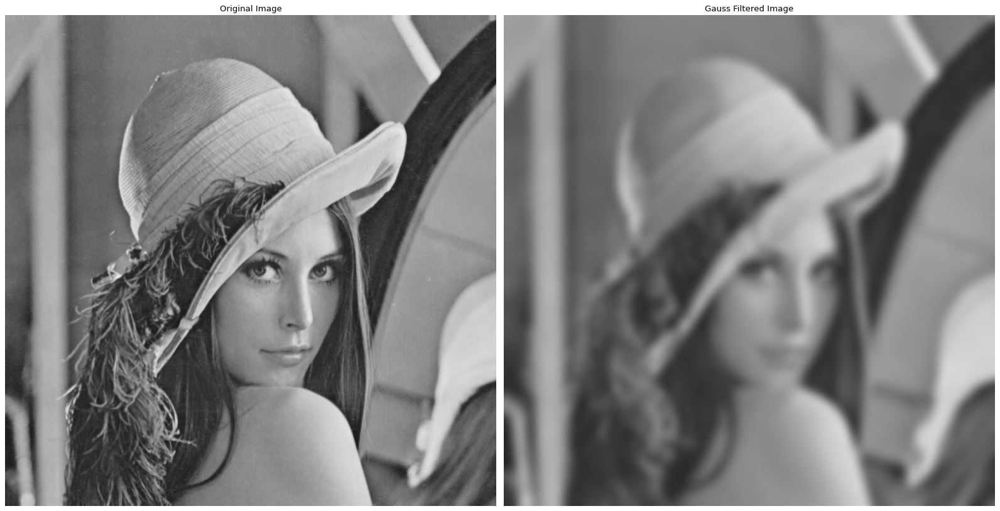

In [9]:
gauss_5 = skimage.filters.gaussian(image, sigma=5, mode='nearest', truncate=4/2)

figure, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,14), dpi=80)
for plot in ax.flatten():
    plot.axis('off')

ax[0].imshow(image,     cmap='gray', vmin=0, vmax=1), ax[0].set_title('Original Image')
ax[1].imshow(gauss_5,     cmap='gray', vmin=0, vmax=1), ax[1].set_title('Gauss Filtered Image'), ax[1].axis('off')
plt.tight_layout()
plt.show()

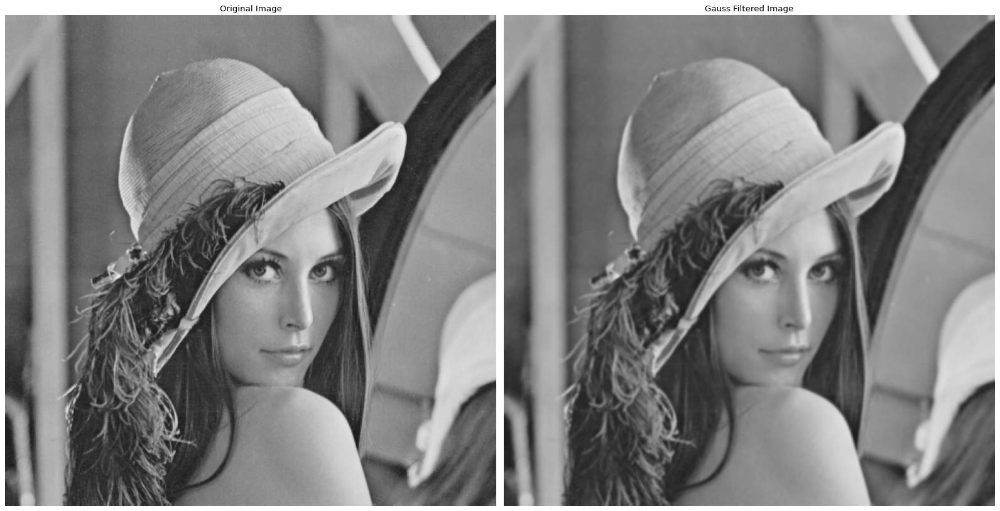

In [10]:
gauss_1 = skimage.filters.gaussian(image, sigma=1, mode='nearest', truncate=4/2)

figure, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,14), dpi=80)
for plot in ax.flatten():
    plot.axis('off')

ax[0].imshow(image,     cmap='gray', vmin=0, vmax=1), ax[0].set_title('Original Image')
ax[1].imshow(gauss_1,     cmap='gray', vmin=0, vmax=1), ax[1].set_title('Gauss Filtered Image'), ax[1].axis('off')
plt.tight_layout()
plt.show()

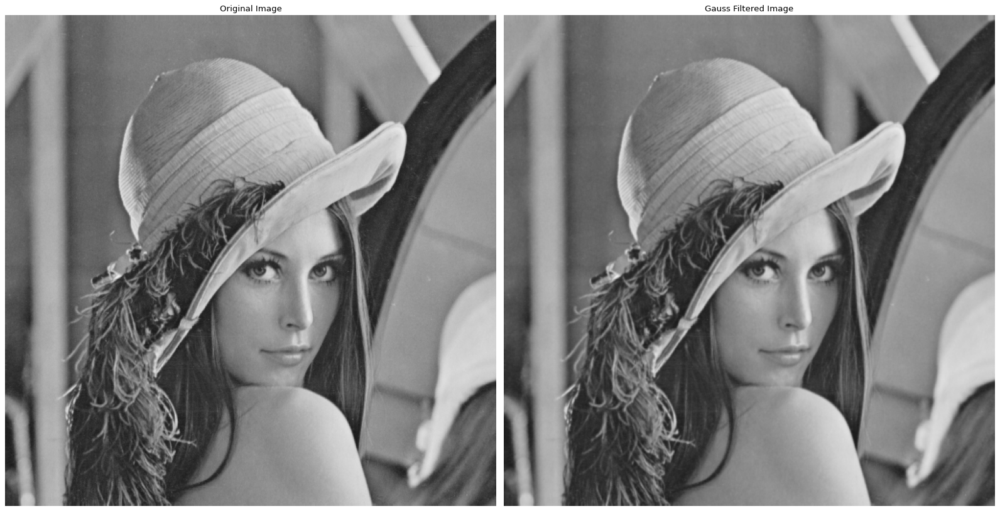

In [11]:
gauss_05 = skimage.filters.gaussian(image, sigma=0.5, mode='nearest', truncate=4/2)

figure, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,14), dpi=80)
for plot in ax.flatten():
    plot.axis('off')

ax[0].imshow(image,     cmap='gray', vmin=0, vmax=1), ax[0].set_title('Original Image')
ax[1].imshow(gauss_05,     cmap='gray', vmin=0, vmax=1), ax[1].set_title('Gauss Filtered Image'), ax[1].axis('off')
plt.tight_layout()
plt.show()

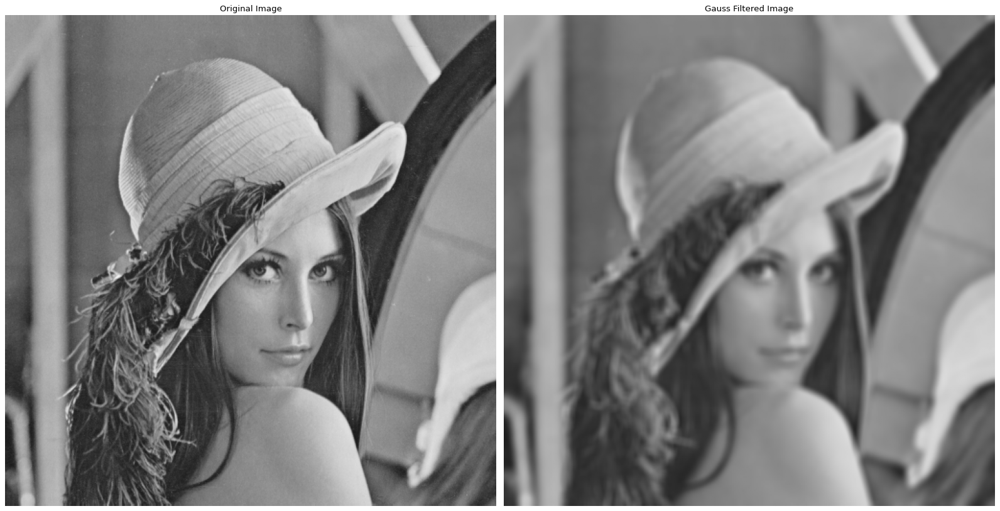

In [12]:
gauss_5 = skimage.filters.gaussian(image, sigma=5, mode='nearest', truncate=4/5)

figure, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,14), dpi=80)
for plot in ax.flatten():
    plot.axis('off')

ax[0].imshow(image,     cmap='gray', vmin=0, vmax=1), ax[0].set_title('Original Image')
ax[1].imshow(gauss_5,     cmap='gray', vmin=0, vmax=1), ax[1].set_title('Gauss Filtered Image'), ax[1].axis('off')
plt.tight_layout()
plt.show()